In [1]:
!pip install azure.cognitiveservices.vision.customvision

In [1]:
from azure.cognitiveservices.vision.customvision.training import CustomVisionTrainingClient
from azure.cognitiveservices.vision.customvision.prediction import CustomVisionPredictionClient
import matplotlib.pyplot as plt
from msrest.authentication import ApiKeyCredentials

import json
import cv2

%matplotlib inline



# Endpoint and key definition for Azure Custom Vision API

In [15]:
configfile = open("config.txt",'r')
read = configfile.read()
for line in read.splitlines():
    if "ENDPOINT" in line:
        ENDPOINT = line.split("=",1)[1]
    if "training_key" in line:
        training_key = line.split("=",1)[1]
    if "prediction_key" in line:
        prediction_key = line.split("=",1)[1]
    if "training_resource_id" in line:
        training_resource_id = line.split("=",1)[1]
    if "prediction_resource_id" in line:
        prediction_resource_id = line.split("=",1)[1]
    if "POWER_AI_VISION_API_URL" in line:
        POWER_AI_VISION_API_URL = line.split("=",1)[1]

In [3]:
credentialsTrain   = ApiKeyCredentials(in_headers={"Training-key":   training_key})
train   = CustomVisionTrainingClient  (ENDPOINT, credentialsTrain)
credentialsPredict = ApiKeyCredentials(in_headers={"prediction-key": prediction_key})
predict = CustomVisionPredictionClient(ENDPOINT, credentialsPredict)

projects = train.get_projects()
projects = train.get_projects()
project = None

for p in projects:
    if p.name == "Cars":
        project = p
iterations = train.get_iterations(project.id)

# Helper functions for plotting

In [33]:
def append_predictions(result, confindence_level = 0.75):
    predictions = []
    for prediction in result.predictions:
        if prediction.probability > confindence_level:
            predictions.append(prediction)
            #print(prediction.probability, prediction.tag_name)
            #print(prediction.bounding_box)
    return predictions

# Adds border box and text on images based off predictions
# Custom Vision gives bounding box as noramlized coordinates 
# so they need to be computed to X, Y, Width, and Height that
# Open CV uses
def add_boxes_to_images(img, predictions):
    for pred in predictions:
        x =      int(pred.bounding_box.left   *  img.shape[1])
        y =      int(pred.bounding_box.top    *  img.shape[0])
        x2 = x + int(pred.bounding_box.width  *  img.shape[1])
        y2 = y + int(pred.bounding_box.height *  img.shape[0])
        
        img = cv2.rectangle(img, (x,y), (x2,y2), (0,0,255), 2)
        img = cv2.putText(img, pred.tag_name, (x,y), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,0,255), 1, cv2.LINE_AA, False)

def show_inline_img(img):
    inline_img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10,20))
    plt.axis("off")
    plt.imshow(inline_img)

def showpicture(path):
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    #img = cv2.resize(img,(400,400))    
    show_inline_img(img)
    
def showpicture_with_boxes(path):
    image = cv2.imread(path)
    with open(path, mode="rb") as image_data:
        car_result = predict.detect_image(project.id, "Iteration2", image_data)
    predictions = append_predictions(car_result)
    add_boxes_to_images(image,predictions)
    show_inline_img(image)
    

# Test Custom Vision API on single image

0.915756464 Car {'additional_properties': {}, 'left': 0.0836827457, 'top': 0.201096684, 'width': 0.159891278, 'height': 0.181981355}


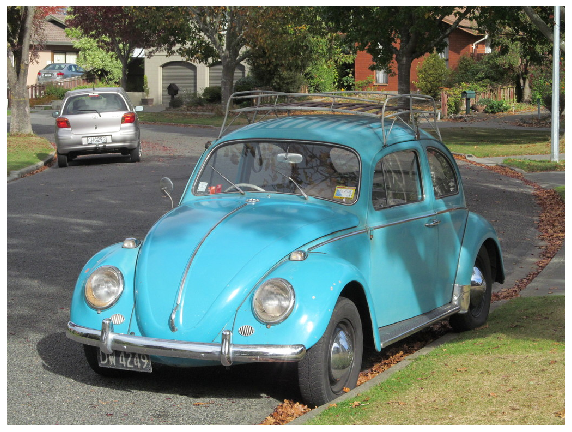

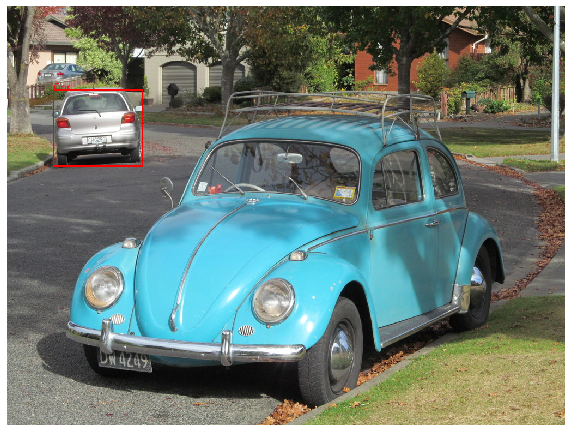

In [35]:
image_path =  "C:/Users/benno/OIDv4_ToolKit/OID/Dataset/train/Car/f95c13a1f0ea2ed5.jpg"
image_path =  "C:/Users/benno/OIDv4_ToolKit/OID/Dataset/train/Car/cfc5d6af55f2d808.jpg"
#image_path = "FRAMES/frame_00087.jpg"

img = cv2.imread(image_path)

with open(image_path, mode="rb") as image_data:
    car_result = predict.detect_image(project.id, "Iteration2", image_data)
print(car_result.predictions[0].probability, car_result.predictions[0].tag_name, car_result.predictions[0].bounding_box)

predictions = append_predictions(car_result)

showpicture(image_path) 

add_boxes_to_images(img,predictions)
show_inline_img(img)

# Parse and explode the video file into JPEGs 

In [14]:
import json
import glob
import math
import os
import shutil
from IPython.display import clear_output, Image, display, Video
import urllib.request
import requests
from requests.packages.urllib3.exceptions import InsecureRequestWarning
requests.packages.urllib3.disable_warnings(InsecureRequestWarning)

In [8]:
input_video = "C:/Users/benno/Documents/Coursera_Courses/powerai-counting-cars-master/powerai-counting-cars-master/notebooks/carvideo.mp4"  # The input video
START_LINE = 0  # If start line is > 0, cars won't be added until below the line (try 200)
FRAMES_DIR = "frames"  # Output dir to hold/cache the original frames
FRAMES_DIR_TEST = "frames/test"
OUTPUT_DIR = "output"  # Output dir to hold the annotated frames
SAMPLING = 10  # Classify every n frames (use tracking in between)
CONFIDENCE = 0.80  # Confidence threshold to filter iffy objects

# OpenCV colors are (B, G, R) tuples -- RGB in reverse
WHITE = (255, 255, 255)
YELLOW = (66, 244, 238)
GREEN = (80, 220, 60)
LIGHT_CYAN = (255, 255, 224)
DARK_BLUE = (139, 0, 0)
GRAY = (128, 128, 128)

In [9]:
Video(input_video,embed=True)

In [10]:
FRAMES_DIR = "C:/Users/benno/Documents/Coursera_Courses/powerai-counting-cars-master/powerai-counting-cars-master/notebooks/FRAMES"
OUTPUT_DIR = "C:/Users/benno/Documents/Coursera_Courses/powerai-counting-cars-master/powerai-counting-cars-master/notebooks/OUTPUT"
if not os.path.isdir(FRAMES_DIR):
    os.mkdir(FRAMES_DIR)
if not os.path.isdir(OUTPUT_DIR):
    os.mkdir(OUTPUT_DIR)

# Parse and explode the video file into JPEGs¶ 

In [149]:
if os.path.isfile(input_video):
    video_capture = cv2.VideoCapture(input_video)
else:
    raise Exception("File %s doesn't exist!" % input_video)

total_frames = int(video_capture.get(cv2.CAP_PROP_FRAME_COUNT))
print("Frame count estimate is %d" % total_frames)

num = 0
while video_capture.get(cv2.CAP_PROP_POS_FRAMES) < video_capture.get(cv2.CAP_PROP_FRAME_COUNT):
    success, image = video_capture.read()
    if success:
        num = int(video_capture.get(cv2.CAP_PROP_POS_FRAMES))
        print("Writing frame {num} of {total_frames}".format(
            num=num, total_frames=total_frames), end="\r")
        cv2.imwrite('{frames_dir}/frame_{num:05d}.jpg'.format(
            frames_dir=FRAMES_DIR, num=num), image)
    else:
        # TODO: If this happens, we need to add retry code
        raise Exception('Error writing frame_{num:05d}.jpg'.format(
            num=int(video_capture.get(cv2.CAP_PROP_POS_FRAMES))))

print("\nWrote {num} frames".format(num=num))

FRAME_FPS = int(video_capture.get(cv2.CAP_PROP_FPS))
FRAME_WIDTH = int(video_capture.get(cv2.CAP_PROP_FRAME_WIDTH))
FRAME_HEIGHT = int(video_capture.get(cv2.CAP_PROP_FRAME_HEIGHT))
ROI_YMAX = int(round(FRAME_HEIGHT * 0.75))  # Bottom quarter = finish line

print("Frame Dimensions: %sx%s" % (FRAME_WIDTH, FRAME_HEIGHT))

Frame count estimate is 1769
Writing frame 1769 of 1769
Wrote 1769 frames
Frame Dimensions: 960x540


# Show image(s) and boxes from video / Send to Custom Vision API

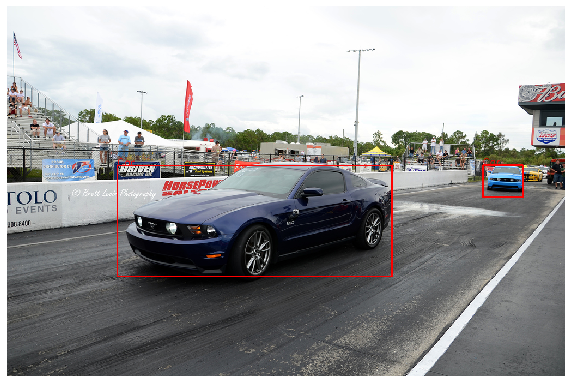

In [11]:
testframepath = "FRAMES/frame_00243.jpg"
testframepath = "C:/Users/benno/OIDv4_ToolKit/OID/Dataset/validation/Vehicle/0b34dfd0400090dd.jpg"
showpicture_with_boxes(testframepath)

# Detect cars in frames from Video / Inference, tracking, and annotation

In [271]:
for filename in sorted(glob.glob(os.path.join(os.path.abspath(FRAMES_DIR),
                                              'frame_*.jpg'))):
    filename = filename.replace("\\","/")
    
    with open(filename, mode="rb") as image_data:
        car_result = predict.detect_image(project.id, "Iteration2", image_data)
    
    predictions = append_predictions(car_result)

    frame = cv2.imread(filename)
    add_boxes_to_images(frame,predictions)
    cv2.imwrite(os.path.join(os.path.abspath(OUTPUT_DIR),filename.rsplit('/')[-1]),frame)
    
    

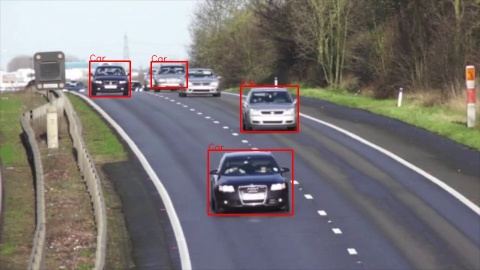


Done


In [12]:
for filename in sorted(glob.glob(os.path.join(os.path.abspath(OUTPUT_DIR),
                                              'frame_*.jpg'))):
    frame = cv2.imread(filename)
    clear_output(wait=True)
    rows, columns, _channels = frame.shape
    frame = cv2.resize(frame, (int(columns/2), int(rows/2)))  # shrink it
    _ret, jpg = cv2.imencode('.jpg', frame)
    display(Image(data=jpg))

print("\nDone")

# PART 2: PowerAI Vision inference wrapper / Follow objects

In [44]:
s = requests.Session()
#JSON Output format:
#    "classified": [
#    {
#      "confidence": 0.9997443556785583,
#      "ymax": 370,
#      "label": "car",
#      "xmax": 516,
#      "xmin": 365,
#      "ymin": 240
#    }
#  ]
        
def detect_objects(filename):
    img = cv2.imread(filename)
    
    with open(image_path, mode="rb") as image_data:
        car_result = predict.detect_image(project.id, "Iteration2", image_data)
    data = {}
    data["classified"] = []
    data["classified"].append({
        "confindence": str(car_result.predictions[0].probability),        
        "label": str(car_result.predictions[0].tag_name),
        "xmin":  str(int(car_result.predictions[0].bounding_box.left   * img.shape[1])),
        "xmax":  str(int(car_result.predictions[0].bounding_box.top    * img.shape[0])),
        "ymax":  str(int(car_result.predictions[0].bounding_box.left   * img.shape[1]) + int(car_result.predictions[0].bounding_box.width * img.shape[1])),
        "ymin":  str(int(car_result.predictions[0].bounding_box.height * img.shape[0]) + int(car_result.predictions[0].bounding_box.top   * img.shape[0]))        
    })
    json_object = json.dumps(data)
    return json_object



#    with open(filename, 'rb') as f:
#        # WARNING! verify=False is here to allow an untrusted cert!
#        r = s.post(POWER_AI_VISION_API_URL,
#                   files={'files': (filename, f)},
#                   verify=False)

#    return r.status_code, json.loads(r.text)

In [45]:
jsonresp = detect_objects(testframepath)
print("jsonresp: %s" % jsonresp)
if 'classified' in jsonresp:
    print("Got back %d objects" % len(jsonresp['classified']))
print(json.dumps(jsonresp, indent=2))

jsonresp: {"classified": [{"confindence": "0.915756464", "label": "Car", "xmin": "85", "xmax": "136", "ymax": "248", "ymin": "259"}]}


TypeError: string indices must be integers

In [17]:
rc,jsonresp = detect_objects(testframepath)
print("rc = %d" % rc)
print("jsonresp: %s" % jsonresp)
if 'classified' in jsonresp:
    print("Got back %d objects" % len(jsonresp['classified']))
print(json.dumps(jsonresp, indent=2))

rc = 401
jsonresp: {'error': {'code': '401', 'message': 'Access denied due to invalid subscription key or wrong API endpoint. Make sure to provide a valid key for an active subscription and use a correct regional API endpoint for your resource.'}}
{
  "error": {
    "code": "401",
    "message": "Access denied due to invalid subscription key or wrong API endpoint. Make sure to provide a valid key for an active subscription and use a correct regional API endpoint for your resource."
  }
}
